<a href="https://colab.research.google.com/github/Mastemace/GZAPV_2021/blob/main/P20041/GZAPV_cv_03_17_face_detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2 as cv
from google.colab.patches import cv_imshow
import numpy as np

In [2]:
tracker = cv.TrackerKCF_create()
cc = cv.CascadeClassifier('haarcascade_frontalface_default.xml')

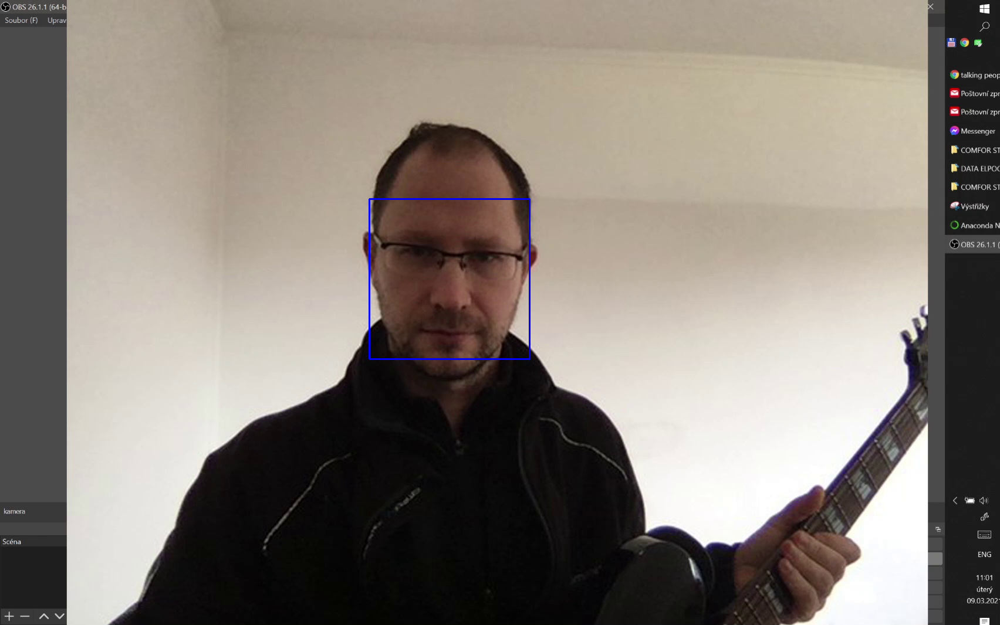

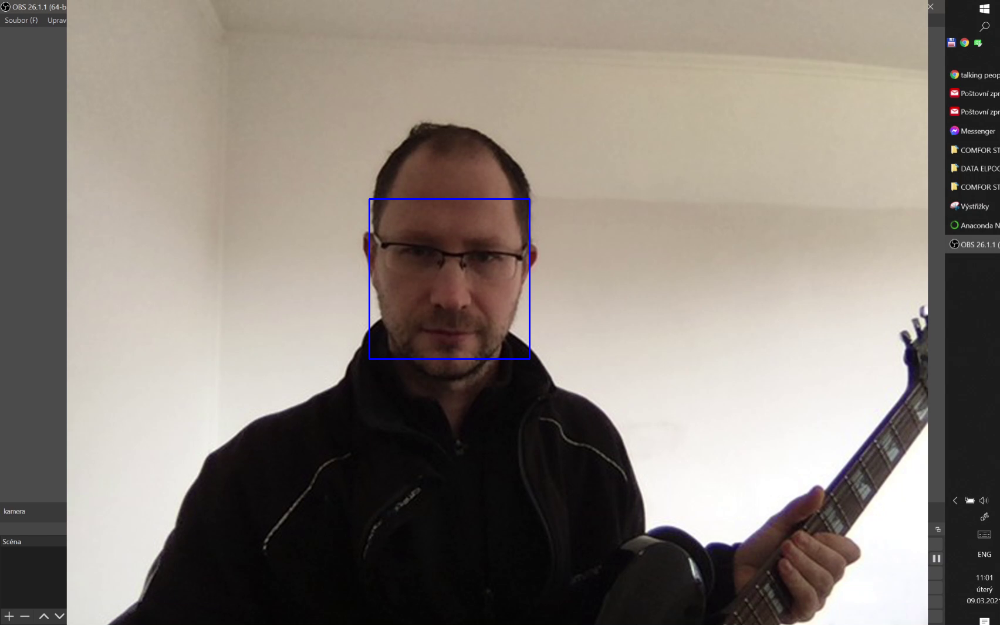

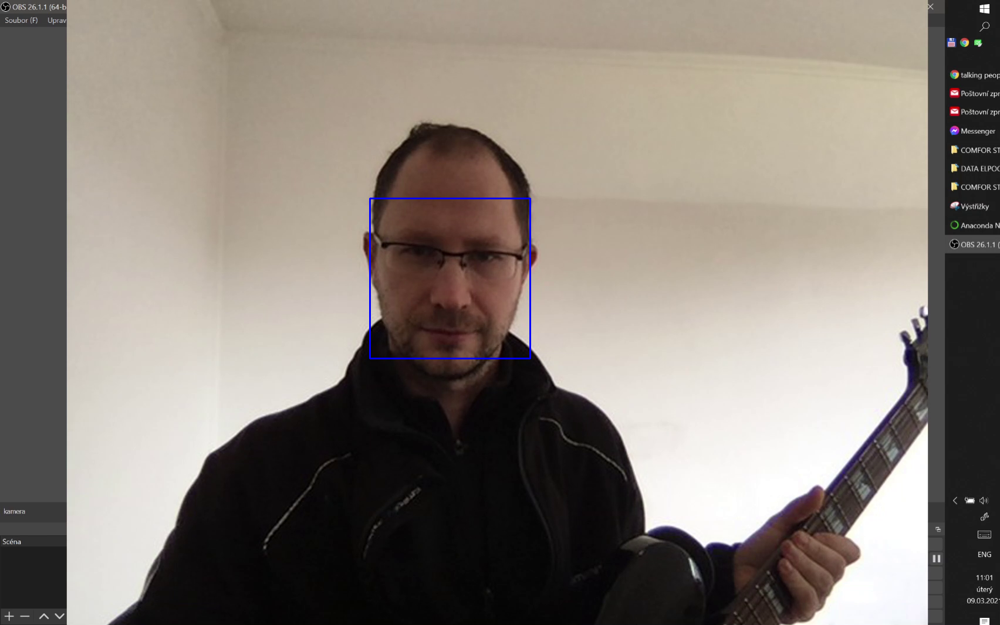

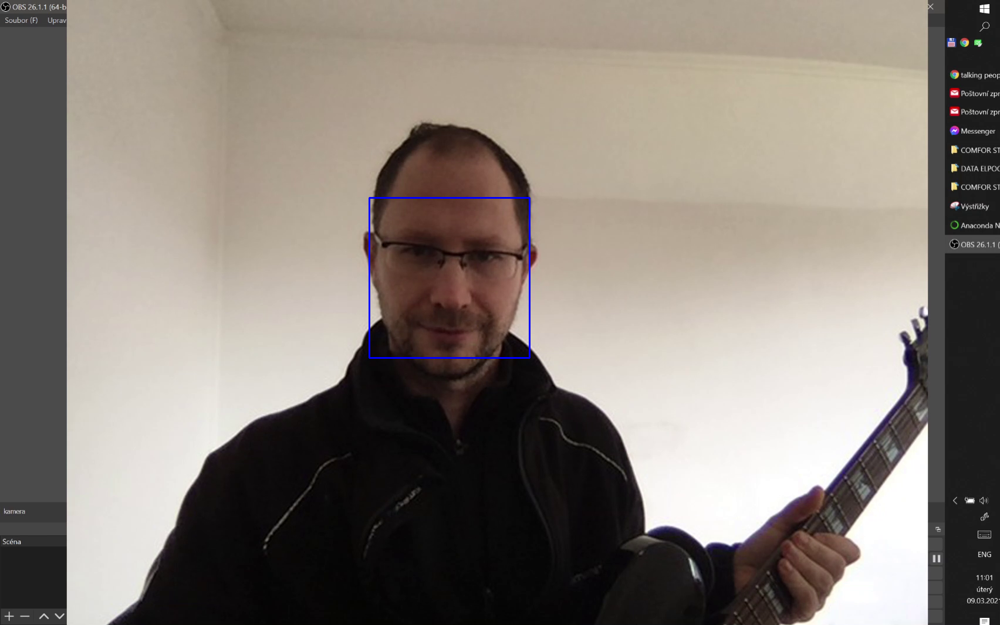

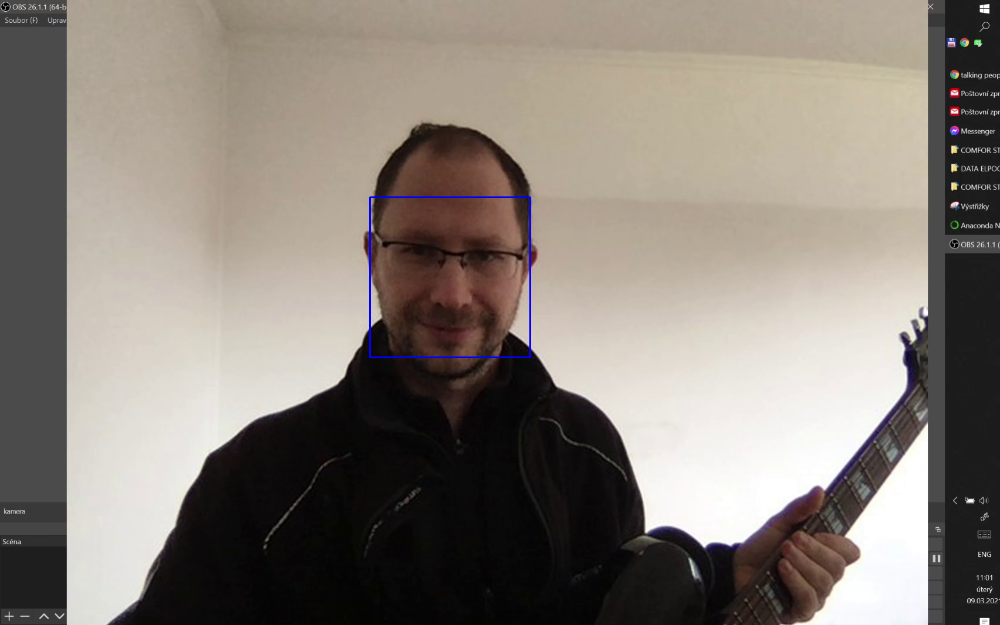

...

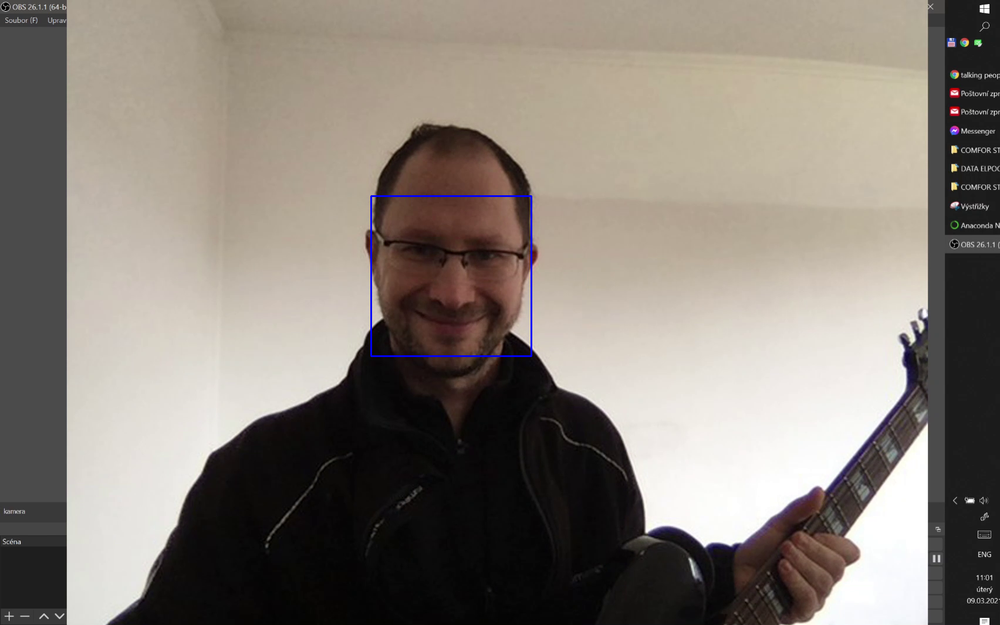

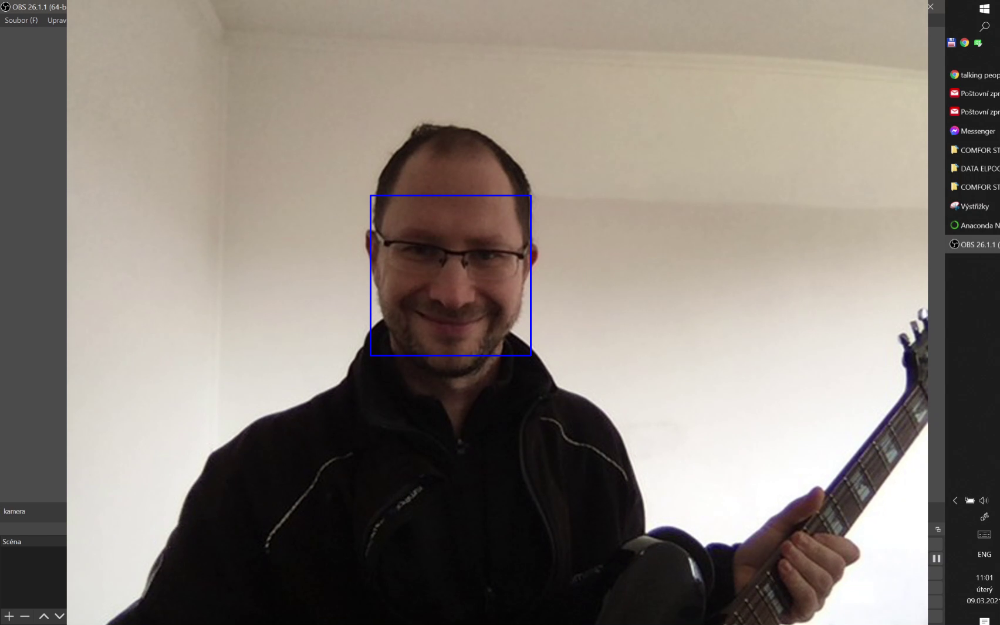

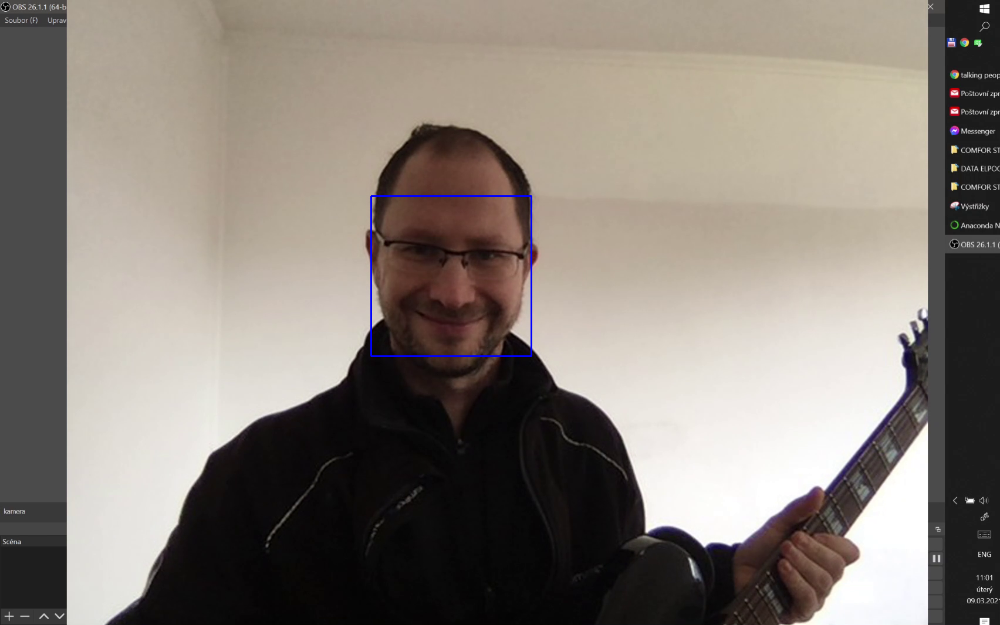

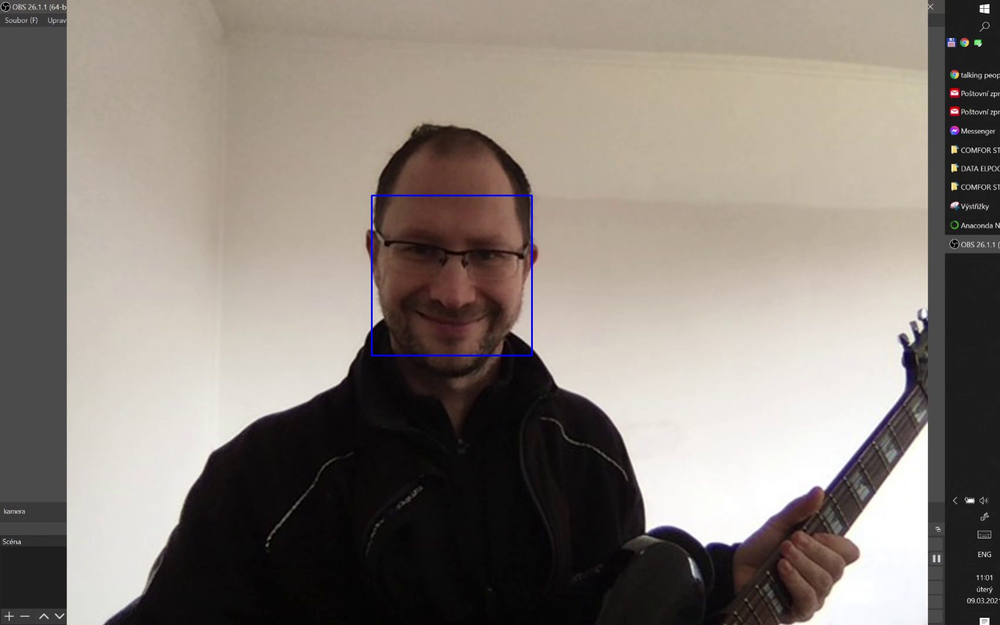

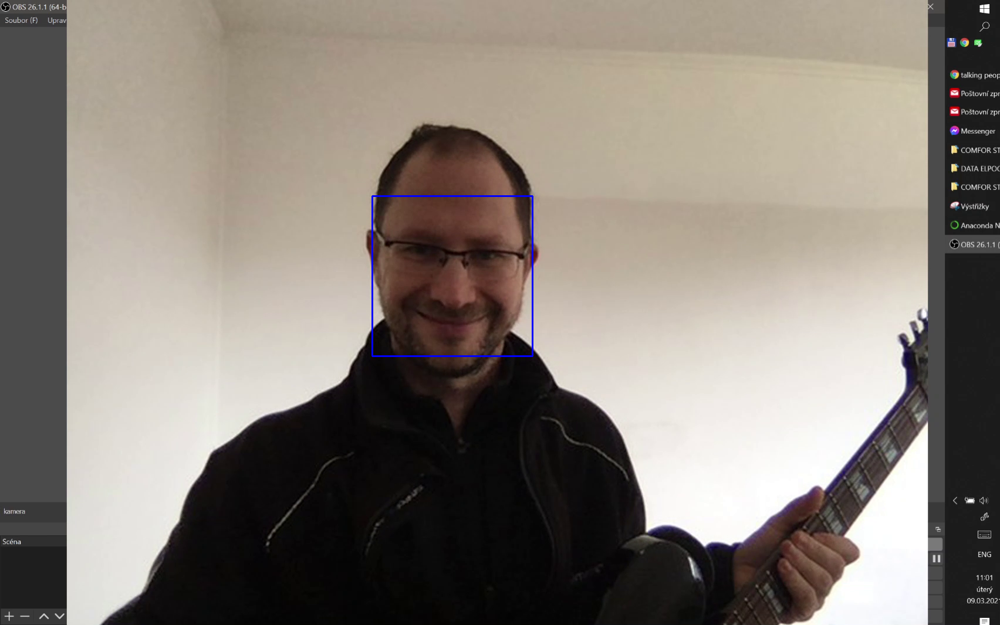

KeyboardInterrupt: ignored

In [3]:
video = cv.VideoCapture('face.mp4')
init = False
tracking = False

while True:
  ret, frame = video.read()
  if ret == False: break

  if tracking == False: 
    obliceje = cc.detectMultiScale(cv.cvtColor(frame, cv.COLOR_BGR2GRAY), 1.5, 1)
    if (len(obliceje) > 0):
      oblicej = obliceje[0]
      tracking = tracker.init(frame, tuple(oblicej))
    else:
      oblicej = (0, 0, 0, 0)
      continue
    #tracker.init(frame, (oblicej[0], oblicej[1], oblicej[2], oblicej[3]))
    #init = True

  else:
    tracking, oblicej = tracker.update(frame)
    if tracking == False: oblicej = (0, 0, 0, 0)

  # if init == True:
  #   searched, area = tracker.update(frame)
  # if searched == False:
  #   print('nenalezeno')

  frame = cv.rectangle(frame, (int(oblicej[0]), int(oblicej[1])), (int(oblicej[0]+oblicej[2]), int(oblicej[1]+oblicej[3])), (255, 0, 0), 2)

  cv_imshow(frame)
  if cv.waitKey(1) &0xff == ord('q'):
    break

video.release()

In [ ]:
video = cv.VideoCapture('face.mp4')
init = False

while True:
  ret, frame = video.read()
  if ret == False: break

  if init == False: 
    #area = cv.selectROI(frame)
    area = (0, 0, 0, 0)
    tracker.init(frame, area)
    init = True
    continue

  if init == True:
    searched, area = tracker.update(frame)
  if searched == False:
    print('nenalezeno')
      break

  frame = cv.rectangle(frame, (int(area[0]), int(area[1])), (int(area[0]+area[2]), int(area[1]+area[3])), (255, 0, 0), 5)

  cv_imshow(frame)
  if cv.waitKey(1) &0xff == ord('q'):
    break

video.release()